In [6]:
from netCDF4 import Dataset, num2date
import numpy as np
import pandas as pd
import xarray as xr
import os
import time
import matplotlib.pyplot as plt
import matplotlib
import gc
from matplotlib import transforms
import matplotlib.colors as clrs
import glob

In [7]:
filein = ("/gpfs/fs7/dfo/hpcmc/comda/stod000/DATA/CAFE/PP_3oceans.nc")
data = Dataset(filein, "r", format="NETCDF4")
print(data)

obsPP = data.variables['npp'][:]
obsPP = obsPP/12

[nt,ny,nx]=np.shape(obsPP)
#obsPP=np.zeros((nt,ny,nx))
#obsPP[:,:,:]=obsPP
    
print(np.shape(obsPP), np.nanmin(obsPP), np.nanmax(obsPP))

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    CDI: Climate Data Interface version ?? (http://mpimet.mpg.de/cdi)
    Conventions: CF-1.6
    history: Fri Dec 08 18:02:21 2023: cdo remapdis,/home/christianj/GPSC_3OM/op/CREG025_LIM3-VFD003_5d_grid_T_19931001-19931005.nc cafe_global_1degree_clim.nc PP_3oceans.nc
    CDO: Climate Data Operators version 1.9.3 (http://mpimet.mpg.de/cdo)
    dimensions(sizes): time(12), x(528), y(735)
    variables(dimensions): float64 time(time), float32 nav_lon(y, x), float32 nav_lat(y, x), float32 npp(time, y, x)
    groups: 
(12, 735, 528) 2.8583019 108.060265


/tmp/ipykernel_8884/3426665531.py:5: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  obsPP = data.variables['npp'][:]


In [8]:
data_file = Dataset("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/regions_mask_6.nc", "r", format="NETCDF4")
regindx = (data_file['regions_mask'][:])
print(regindx.shape)

data_file = Dataset("/home/fid000/WORK7/ANALYSIS/DATA/CREG025_mesh_mask.nc", "r", format="NETCDF4")
tmask = (data_file['tmask'][0,:,:,:])
print(tmask.shape)

print(np.nanmin(regindx),np.nanmean(regindx),np.nanmax(regindx))
print(np.min(tmask),np.mean(tmask),np.max(tmask))

tmask0=tmask[0,:,:].squeeze()

nxy=np.size(regindx)
I = np.reshape(regindx, (nxy,))
nreg=int(max(I))
mask = regindx
mask = mask.flatten()

/tmp/ipykernel_8884/2096643997.py:2: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  regindx = (data_file['regions_mask'][:])
/tmp/ipykernel_8884/2096643997.py:6: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  tmask = (data_file['tmask'][0,:,:,:])


(735, 528)
(75, 735, 528)
0.0 2.0095472683383417 9.0
0 0.3011297327011613 1


<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF4 data model, file format HDF5):
    dimensions(sizes): x(528), y(735), time(12)
    variables(dimensions): float32 nav_lat(y, x), float32 nav_lon(y, x), float32 time(time), float32 PPPHY(time, y, x), float32 PPPHY2(time, y, x)
    groups: 
(12, 735, 528)


/tmp/ipykernel_252594/3889450216.py:7: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]


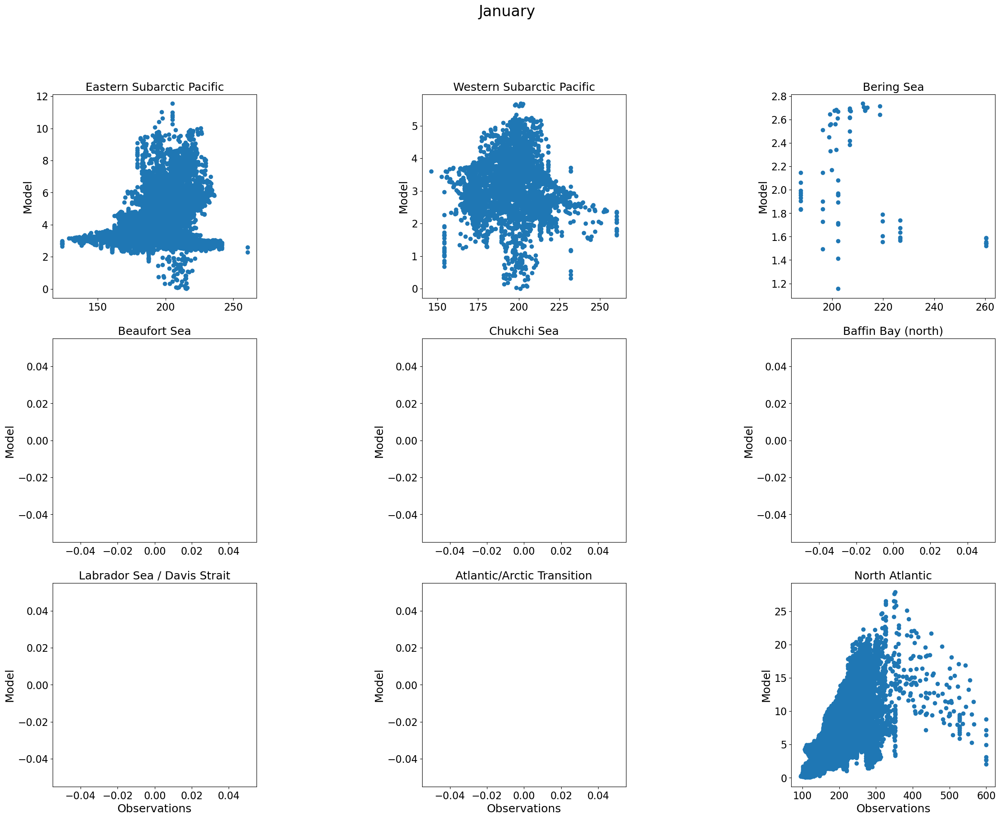

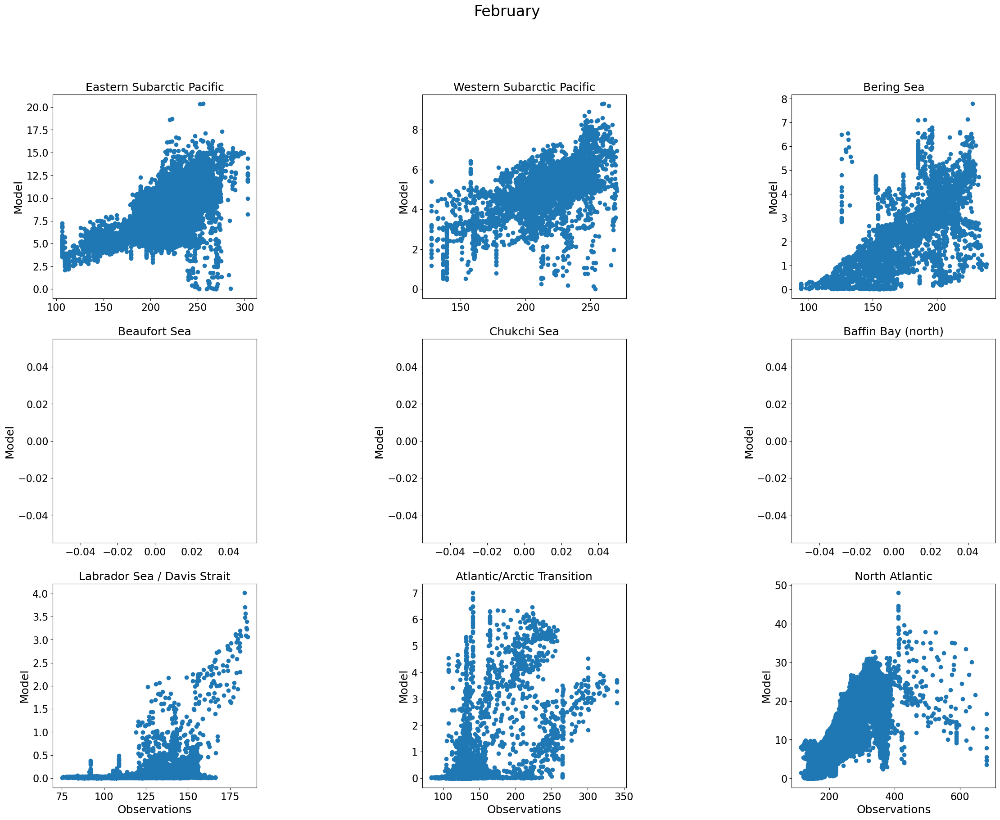

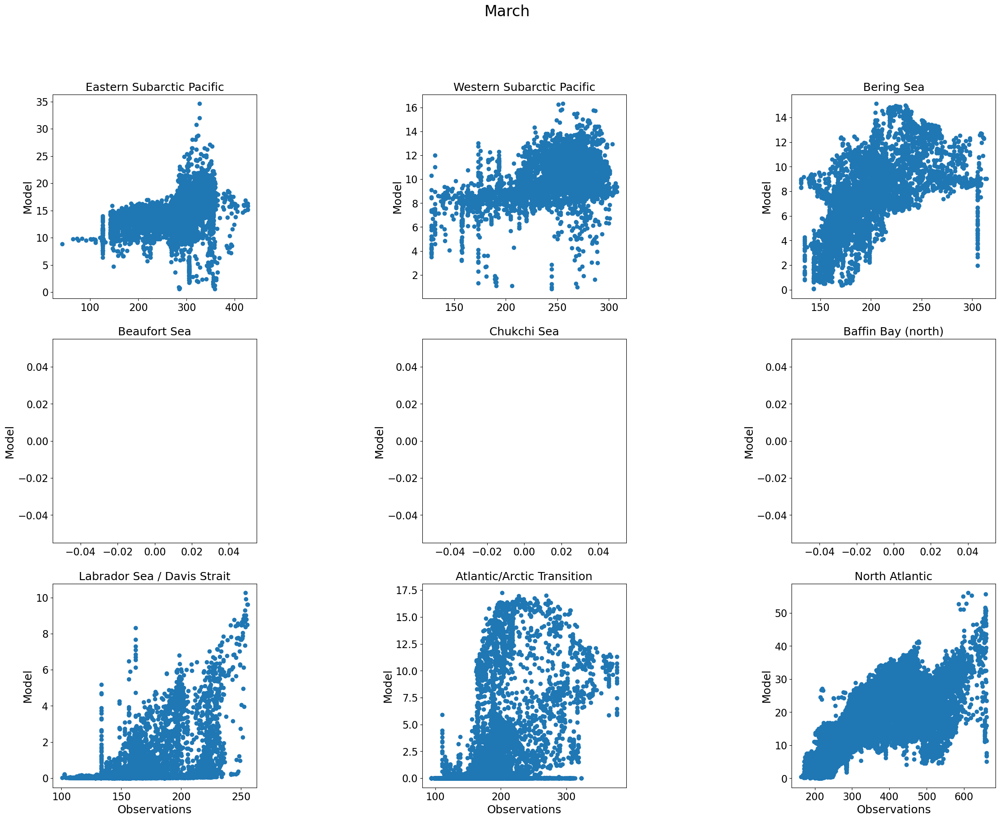

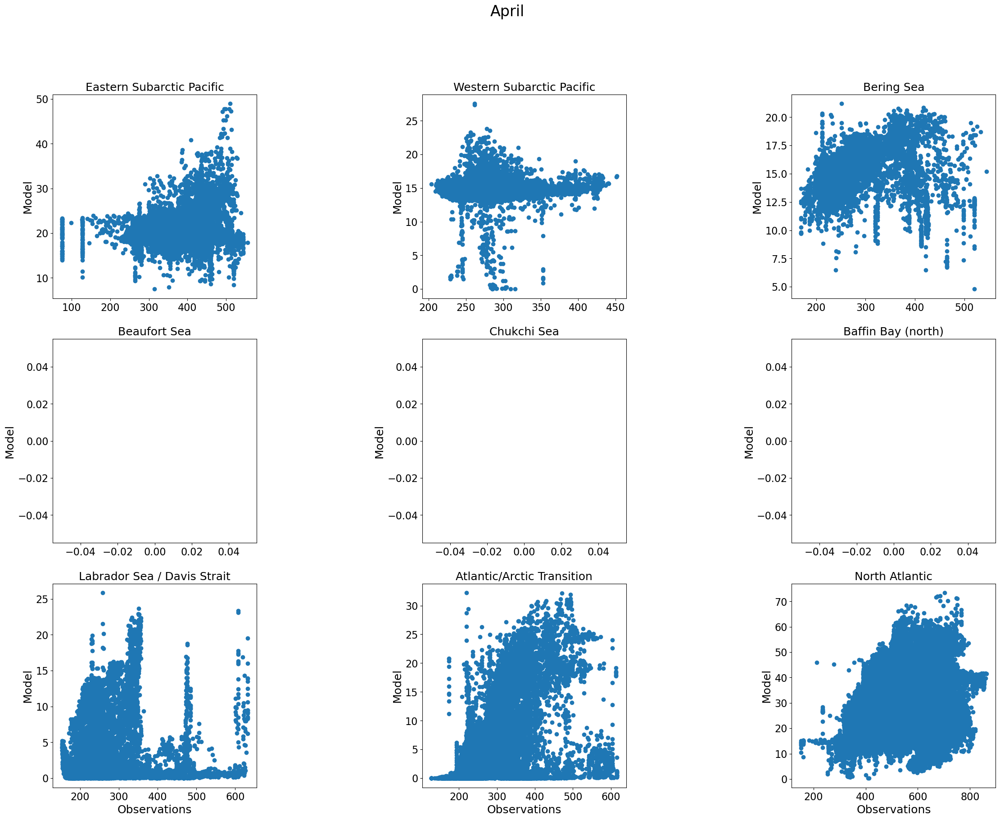

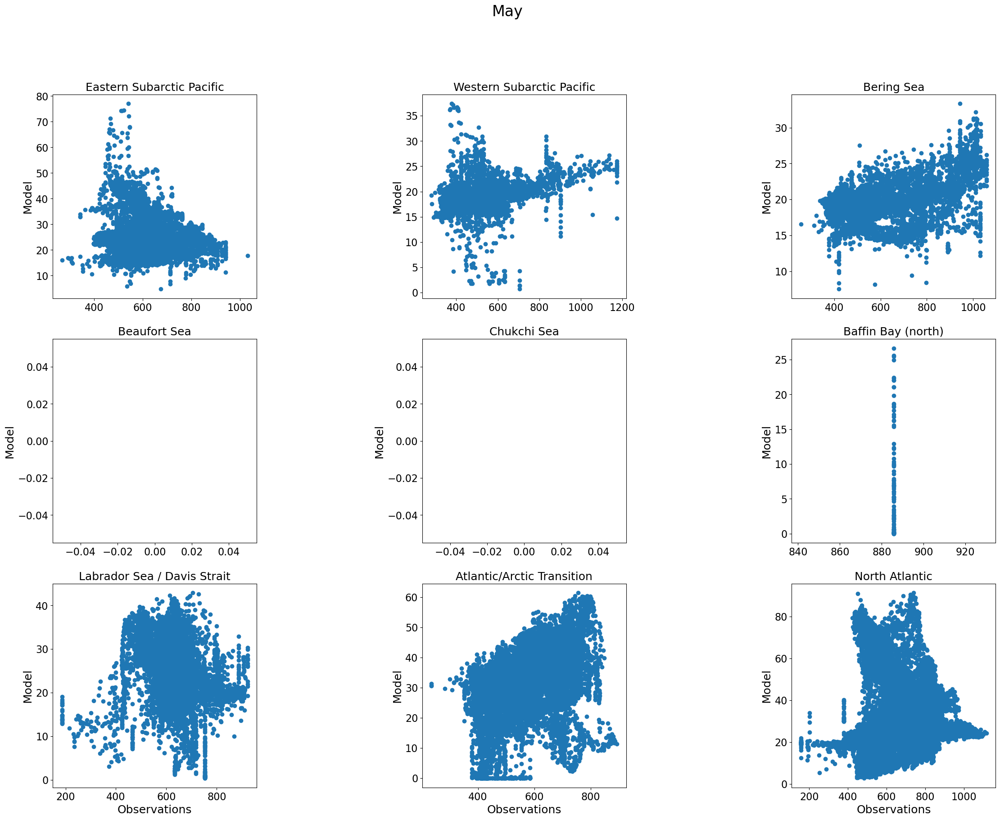

...

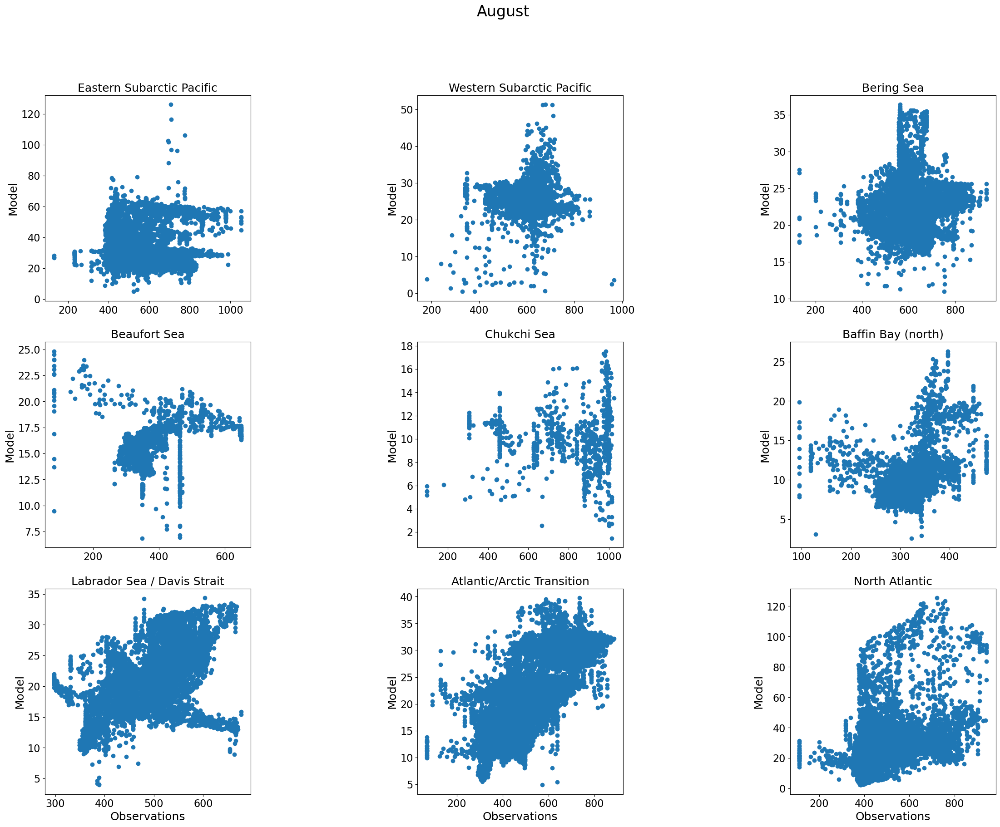

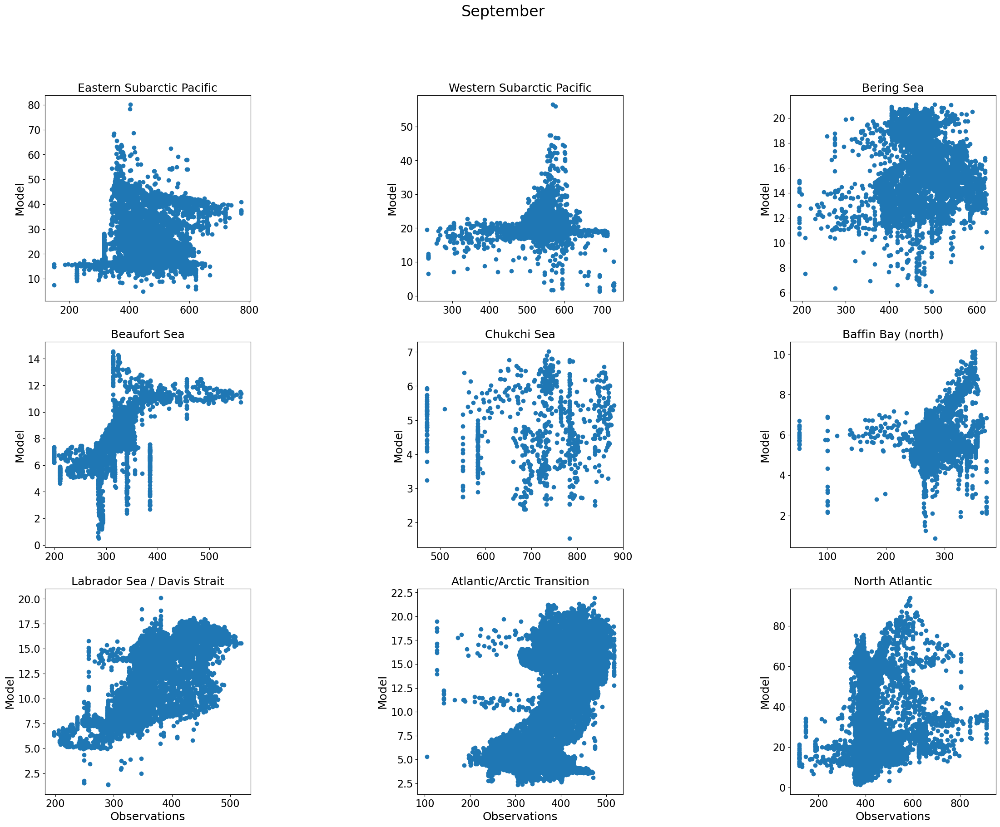

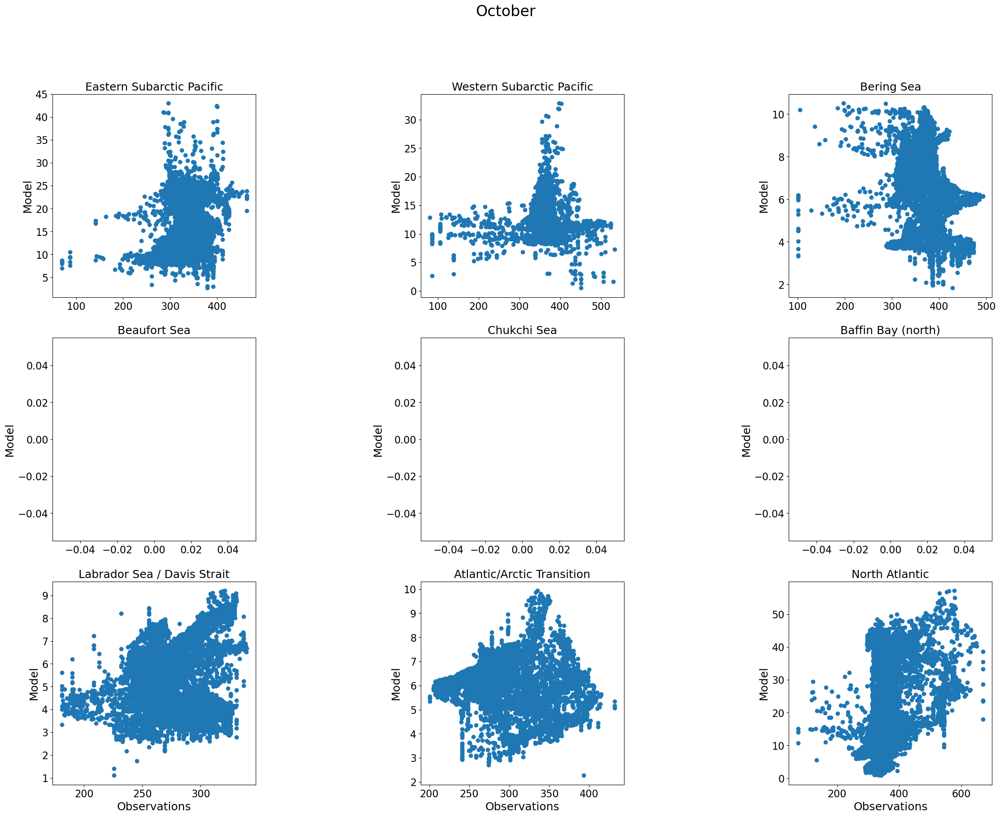

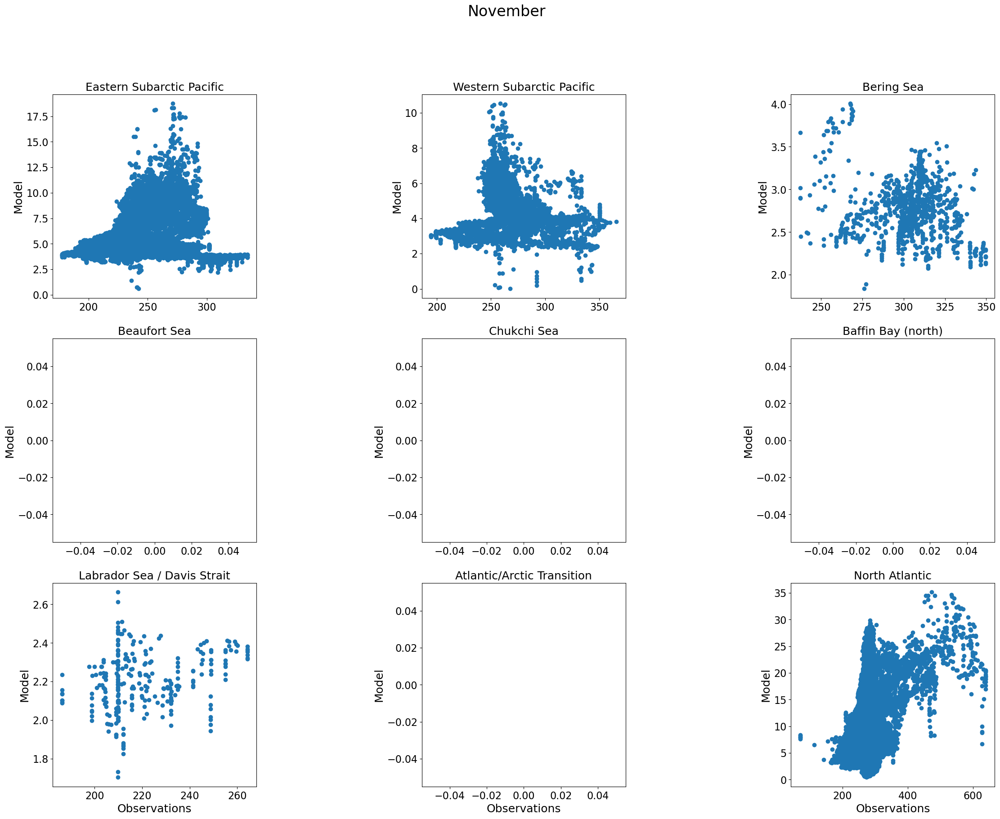

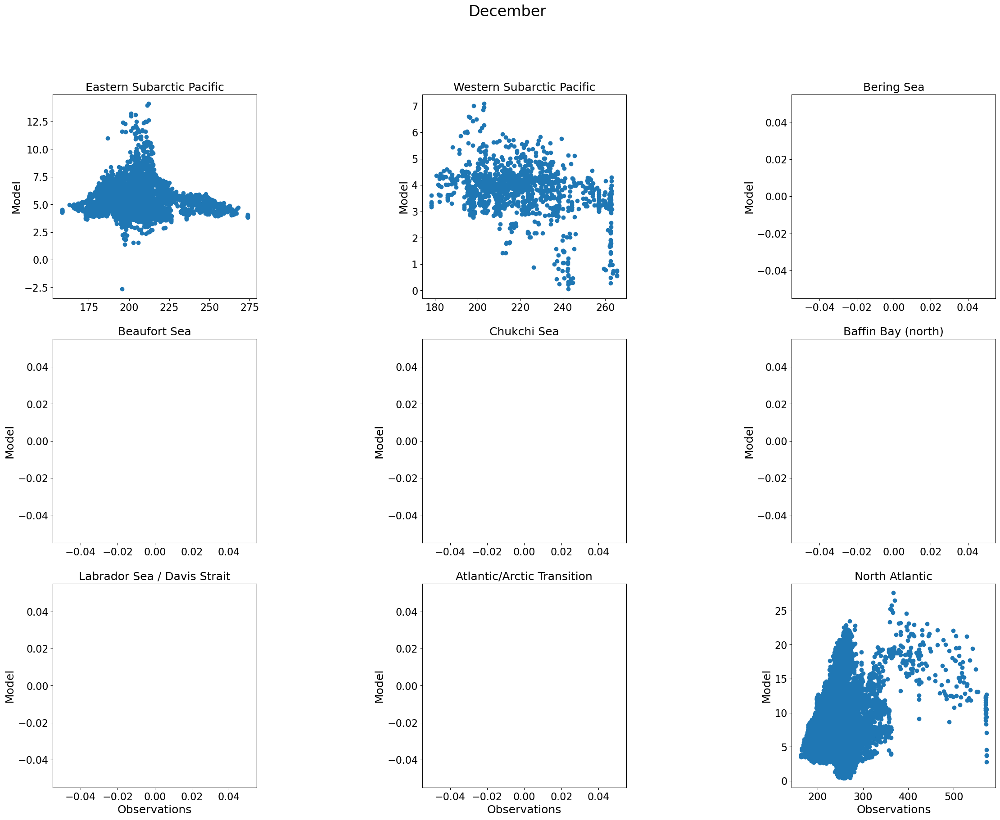

In [15]:
#filein = ("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/pco2/CREG025_LIM3_CANOE-VJC014l_monthly_pco2.nc")
filein = ("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc")

data = Dataset(filein, "r", format="NETCDF4")
print(data)

modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
print(np.shape(modPP))



iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']

#VJC014l_monthly_pco2

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(30, 20))
    fig.suptitle(mmon, fontsize=24) # Change month in accordance with what 'im' is set to below
    
    for i, c in enumerate(regions):    
        cx=plt.subplot(3,3,i+1)
        tmaskz=tmask[iz,:,:].flatten()
        ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
        XOBS=obsPP[im,:,:].squeeze().flatten()
        XMOD=modPP[im,:,:].squeeze().flatten()
        ii=np.where( ~np.isnan(XOBS) )[0]
        XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
        jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
    
        cx.scatter(XOBS[jj], XMOD[jj], label='Obs')
        if i > 5:
            plt.xlabel("Observations", fontsize=18)
        plt.ylabel("Model", fontsize=18)
        plt.title(c, fontsize=18)
        cx.tick_params(axis='both', labelsize=16)
        cx.set_aspect(1./cx.get_data_ratio())
    
    plt.show()
    #fig.savefig("oxygen_model_obs_month"+str("{:02d}".format(im+1)))
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PCO2_VJC014l/pco2_month"+str("{:02d}".format(im+1)))

/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.81


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.85


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.79


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.48


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:65: DeprecationW

0.02


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:65: DeprecationW

0.47


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.82


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.86


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.68


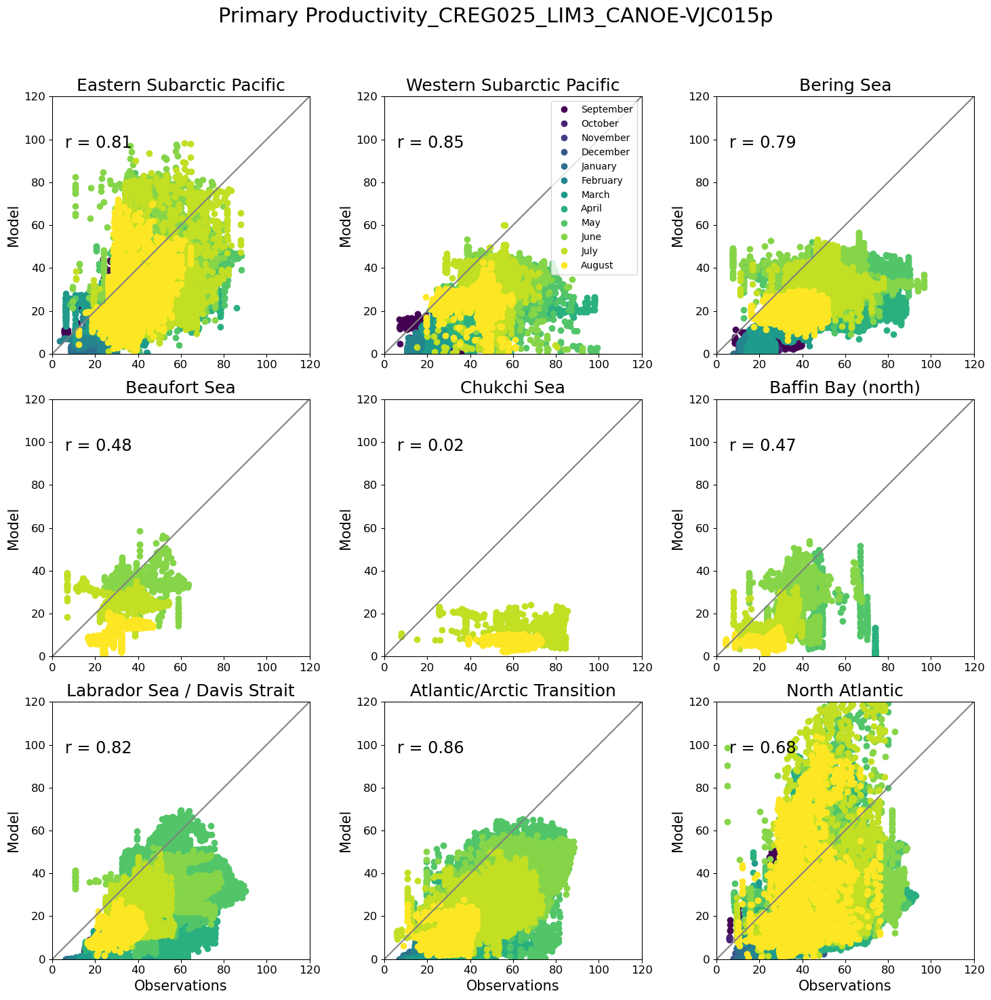

/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.78


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.82


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.79


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.52


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.10


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.61


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.86


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.86


/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
/tmp/ipykernel_814572/2442514640.py:37: DeprecationW

0.63


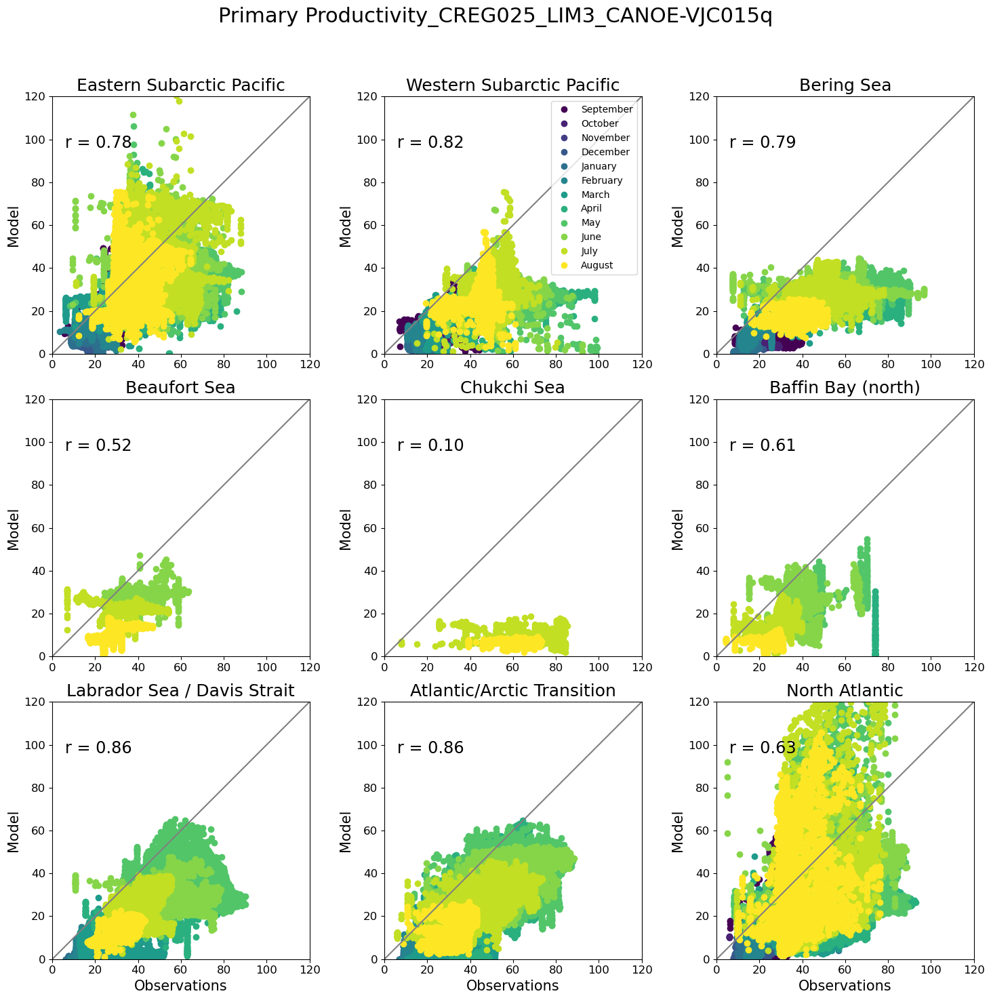

In [5]:
import itertools
fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))

months=['September','October','November','December','January','February','March','April','May','June','July','August']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
iz = 0
#variants = ['CREG025_LIM3_CANOE-VJC014l','CREG025_LIM3_CANOE-VJC014t','CREG025_LIM3_CANOE-VJC014w',
#            'CREG025_LIM3_CANOE-VJC014x','CREG025_LIM3_CANOE-VJC014m','CREG025_LIM3_CANOE-VJC014n',
#            'CREG025_LIM3_CANOE-VJC014o','CREG025_LIM3_CANOE-VJC014p','CREG025_LIM3_CANOE-VJC014y',
#            'CREG025_LIM3_CANOE-VJC014q','CREG025_LIM3_CANOE-VJC014z','CREG025_LIM3_CANOE-VJC014r',
#            'CREG025_LIM3_CANOE-VJC014s','CREG025_LIM3_CANOE-VJC014u','CREG025_LIM3_CANOE-VJC014v',
#            'CREG025_LIM3_CANOE-VJC015a','CREG025_LIM3_CANOE-VJC015b','CREG025_LIM3_CANOE-VJC015c',
#            'CREG025_LIM3_CANOE-VJC015d','CREG025_LIM3_CANOE-VJC015e','CREG025_LIM3_CANOE-VJC015f',
#            'CREG025_LIM3_CANOE-VJC015g','CREG025_LIM3_CANOE-VJC015i','CREG025_LIM3_CANOE-VJC015j',
#            'CREG025_LIM3_CANOE-VJC015k','CREG025_LIM3_CANOE-VJC015l','CREG025_LIM3_CANOE-VJCnep01',
#            'CREG025_LIM3_CANOE-VJCsed01','CREG025_LIM3_CANOE-VJCsed02']

variants = ['CREG025_LIM3_CANOE-VJC015p','CREG025_LIM3_CANOE-VJC015q']

for asuff in variants:
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))
    runid = str(asuff)
    data_all=np.zeros((12,ny,nx))
    fig.suptitle('Primary Productivity_'+asuff, fontsize=22)
    flist = glob.glob("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/"+runid+"_monthly_PP.nc")
    flist.sort()
    ifile = 0
    for i, c, in enumerate(regions):
        cx=plt.subplot(3,3,i+1)
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 12))) # potential pallettes: hsv, jet, gnuplot
        
        for im in np.arange(9,12):
            if im >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
                tmaskz=tmask0.flatten()   
                ZZ=(np.zeros((ny,nx))+regindx).flatten()    # broadcast regions map into a 2D array with same data for each depth

                XOBS=obsPP[im,:,:].squeeze().flatten()
                XMOD=modPP[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                #r = np.corrcoef(XOBS,XMOD); r = str(r); print(r)
                colour = next(colors) 
                plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=im)
                #plt.text(.05, .8, s = r, transform=cx.transAxes) #"Pearson's r ={:.2f}".format(r)
            
            if i > 5:
                plt.xlabel("Observations", fontsize=15)
            plt.ylabel("Model", fontsize=15)
            plt.title(c, fontsize=18)
            #plt.axis('square')
            cx.tick_params(axis='both', labelsize=12)
            cx.set_aspect(1./cx.get_data_ratio())
            
        for im in np.arange(0,9):
            if im >= 0:
                filein = flist[ifile]
                #print(filein)
                data = Dataset(filein, "r", format="NETCDF4")
                modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]
                tmaskz=tmask0.flatten()   
                ZZ=(np.zeros((ny,nx))+regindx).flatten()    # broadcast regions map into a 2D array with same data for each depth

                XOBS=obsPP[im,:,:].squeeze().flatten()
                XMOD=modPP[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                #r = np.corrcoef(XOBS,XMOD); r = str(r); print(r)
                colour = next(colors) 
                plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=im)
                #plt.text(.05, .8, s = r, transform=cx.transAxes)
            if i > 5:
                plt.xlabel("Observations", fontsize=15)

            plt.ylabel("Model", fontsize=15)
            plt.title(c, fontsize=18)
            plt.xlim([0, 120]); plt.ylim([0,120])
            cx.tick_params(axis='both', labelsize=12)
            cx.set_aspect(1./cx.get_data_ratio())
         
        XOBS=obsPP[:,:,:].squeeze().flatten()
        XMOD=modPP[:,:,:].squeeze().flatten()
        ZZ=(np.zeros((12,ny,nx))+regindx).flatten()
        tmask12=(np.zeros((12,ny,nx))+tmask0).flatten()
        ii=np.where( ~np.isnan(XOBS) )[0]
        
        XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmask12=tmask12[ii];
        jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmask12==1) )[0]
        
        r = np.corrcoef(XOBS[jj],XMOD[jj]); r = r[0,1]; r = "{:.2f}".format(r); r = str(r); print(r)
        
        plt.text(.05, .8, s = 'r = '+r, transform=cx.transAxes, fontsize = 'xx-large')
        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
        if i == 1:
            plt.legend(labels=['September','October','November','December','January','February','March','April','May','June','July','August'],
                       fontsize='medium')
    
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/Books/PP/PP_"+runid)
    #plt.close(fig)    

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']


/tmp/ipykernel_814572/3054575594.py:41: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]


/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014t
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014t_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015p
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015p_month

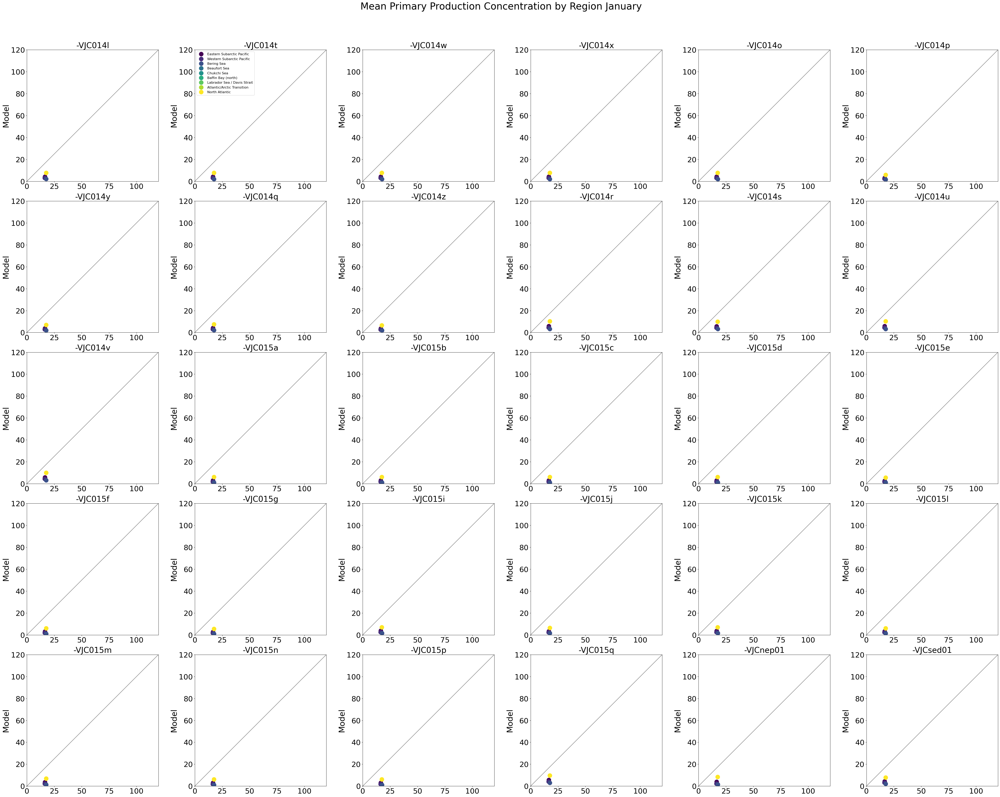

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

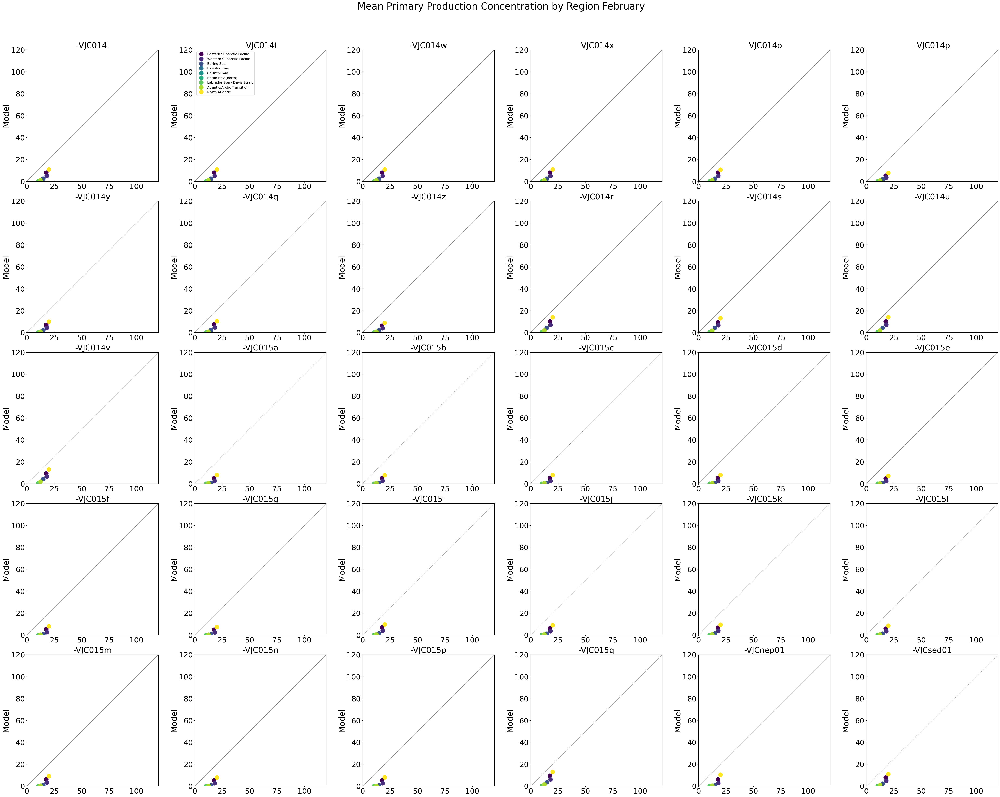

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

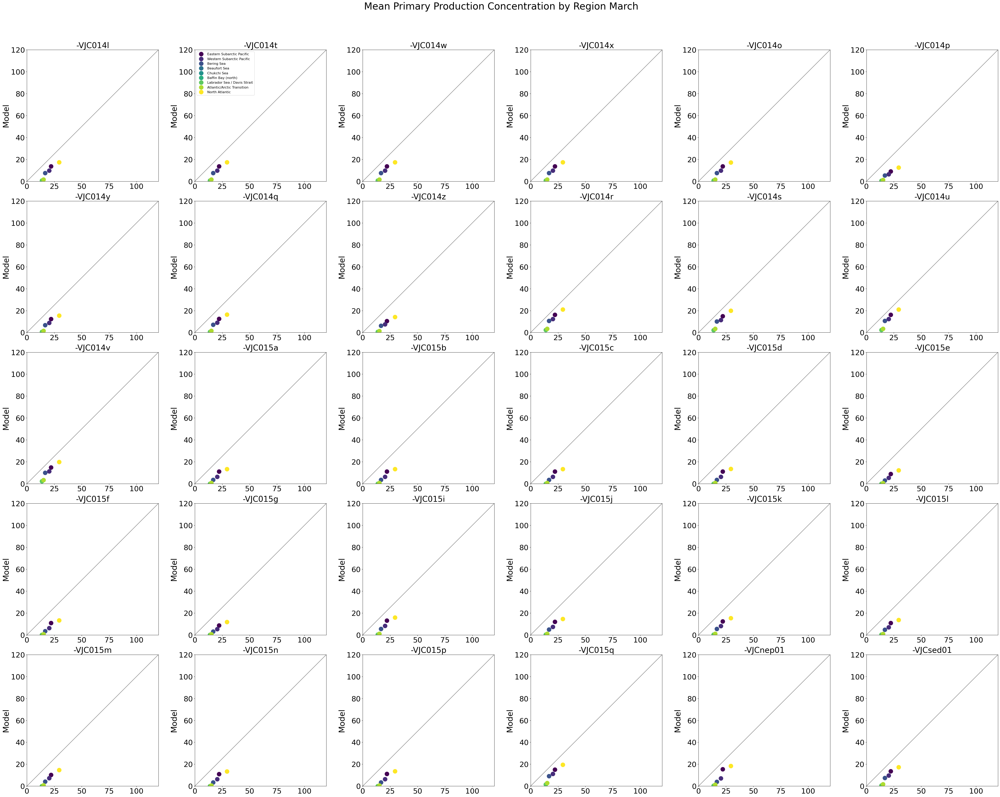

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

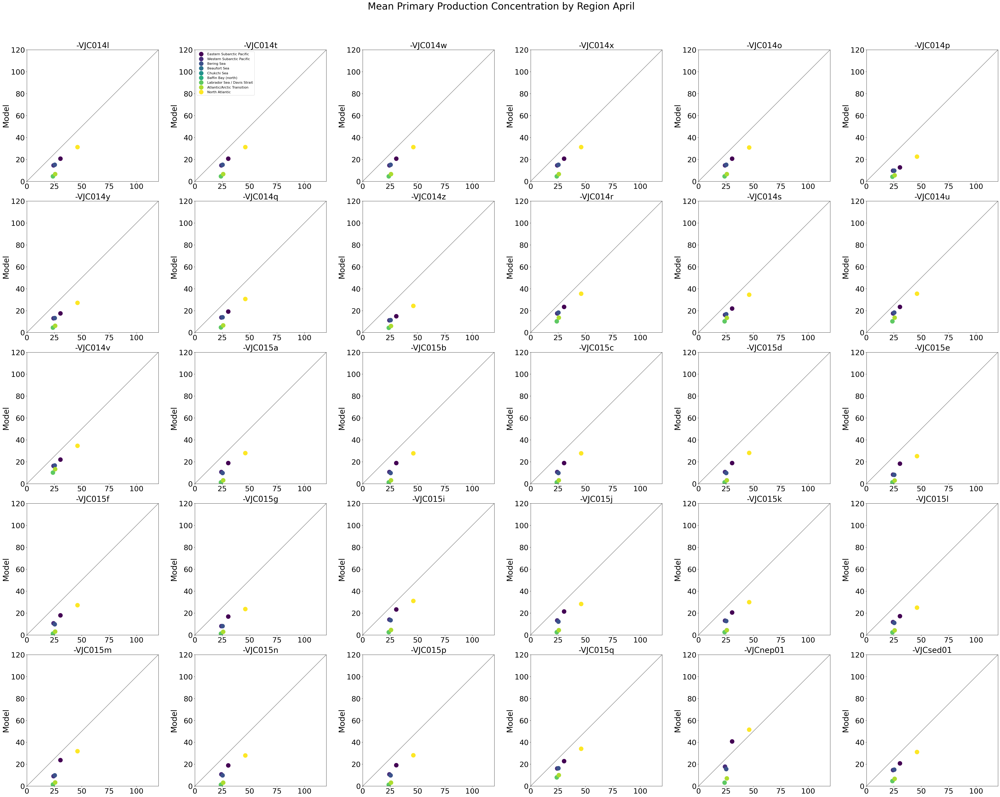

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

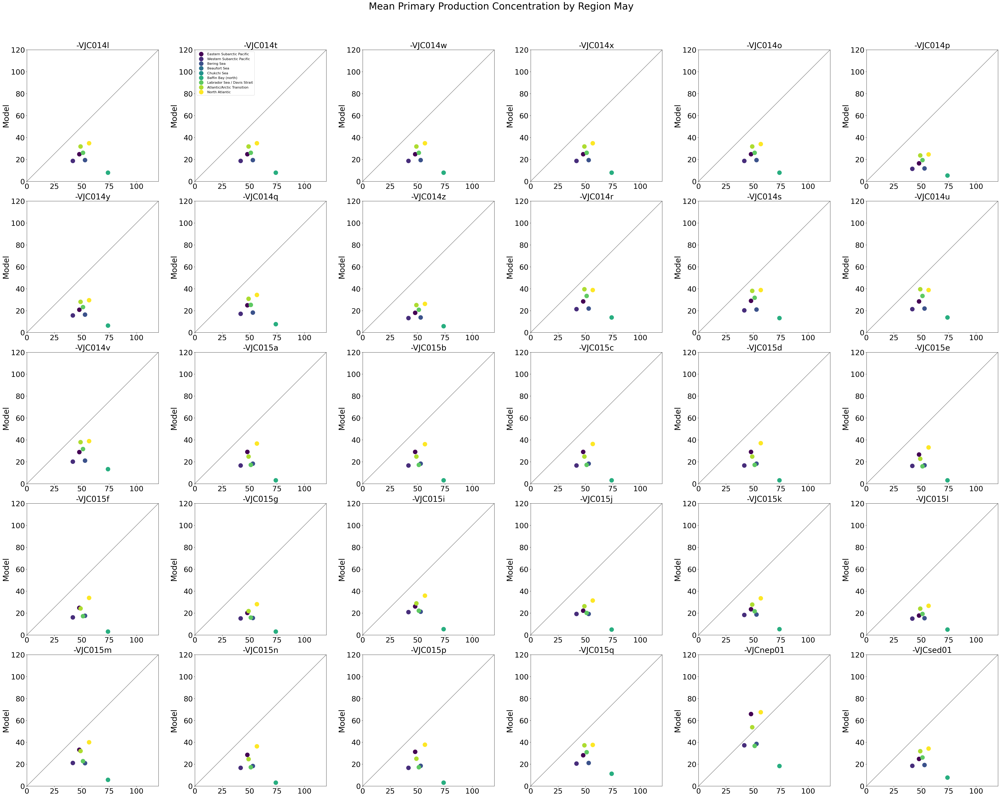

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

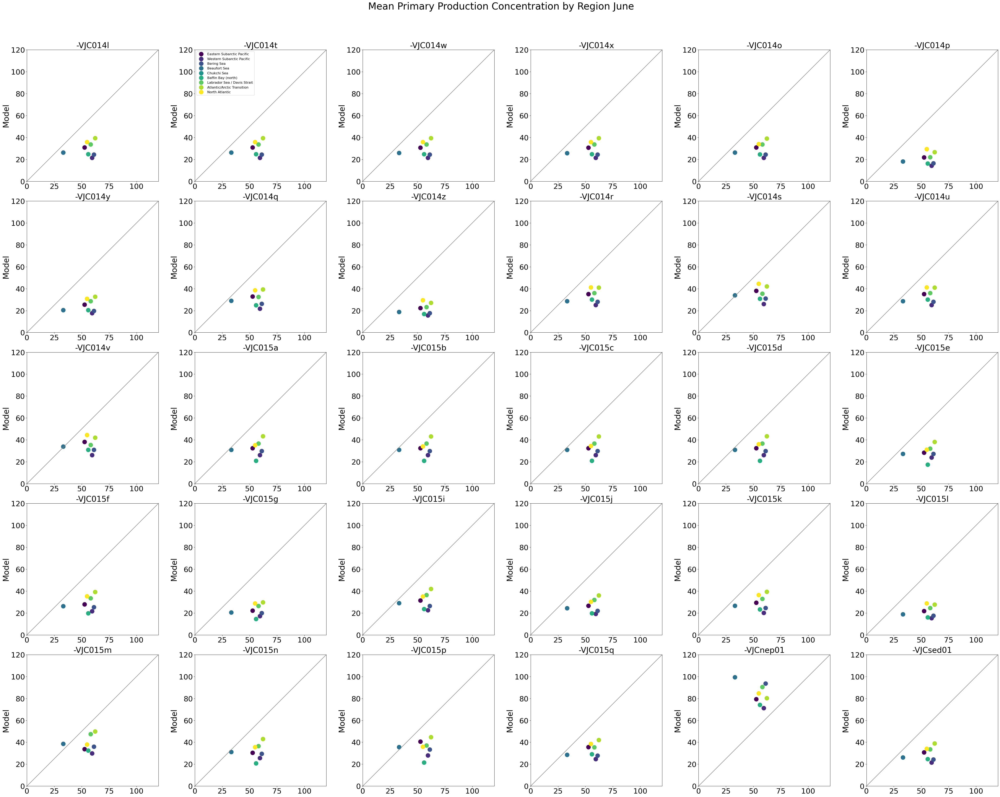

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

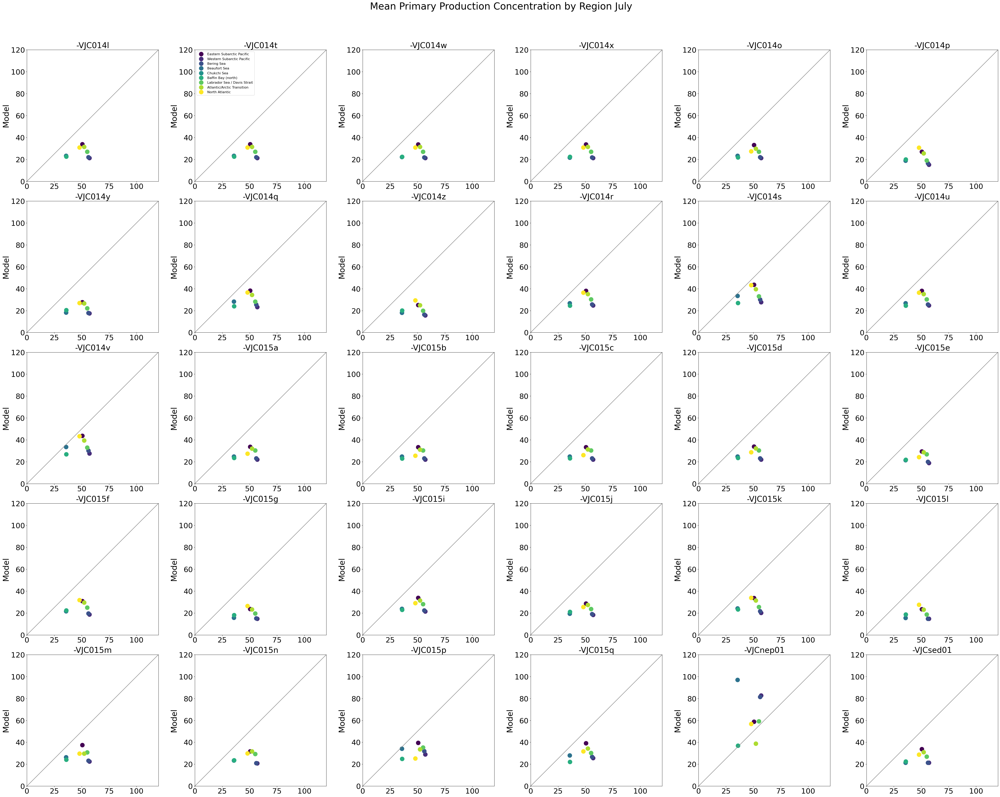

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

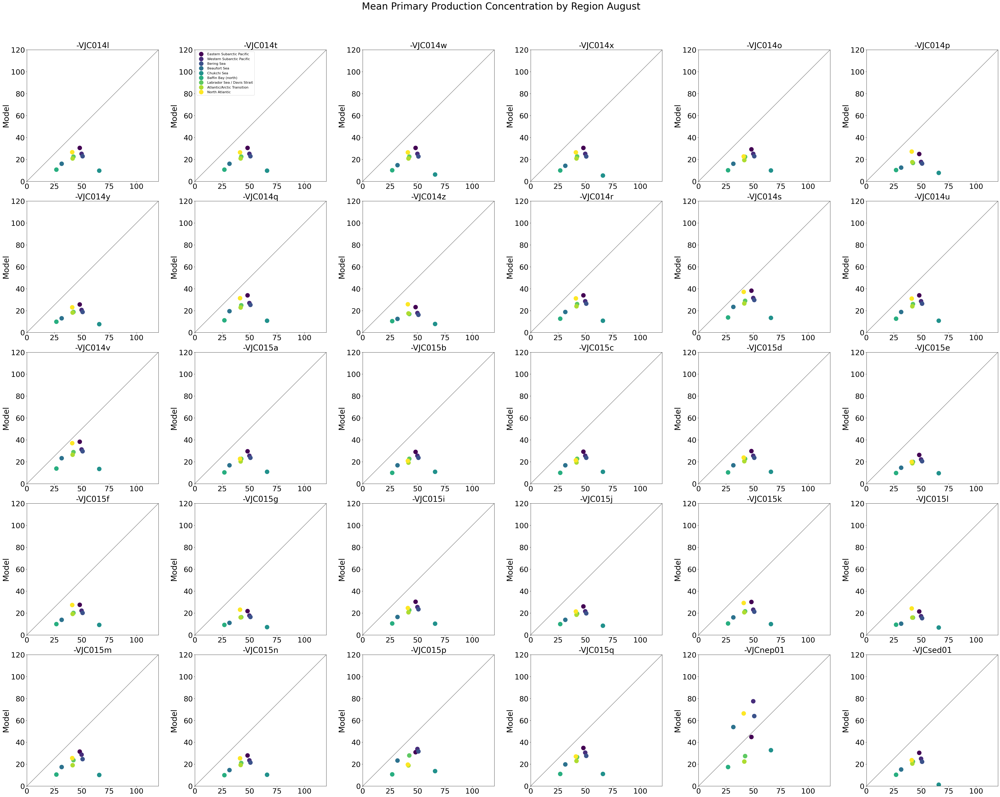

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

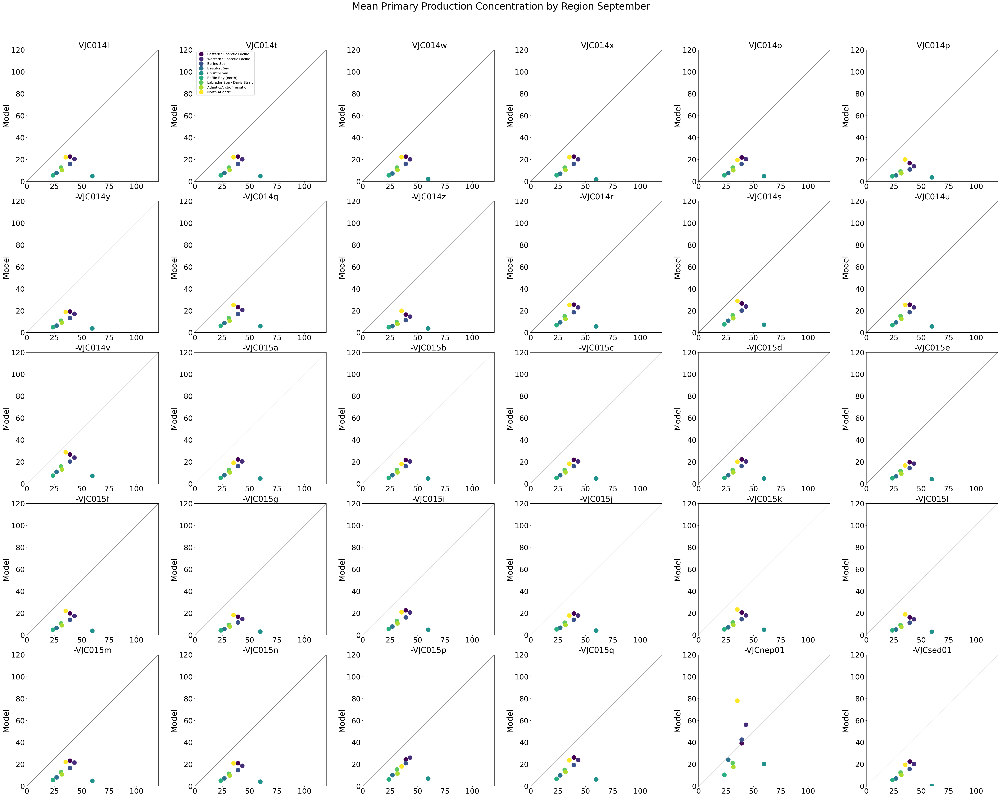

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

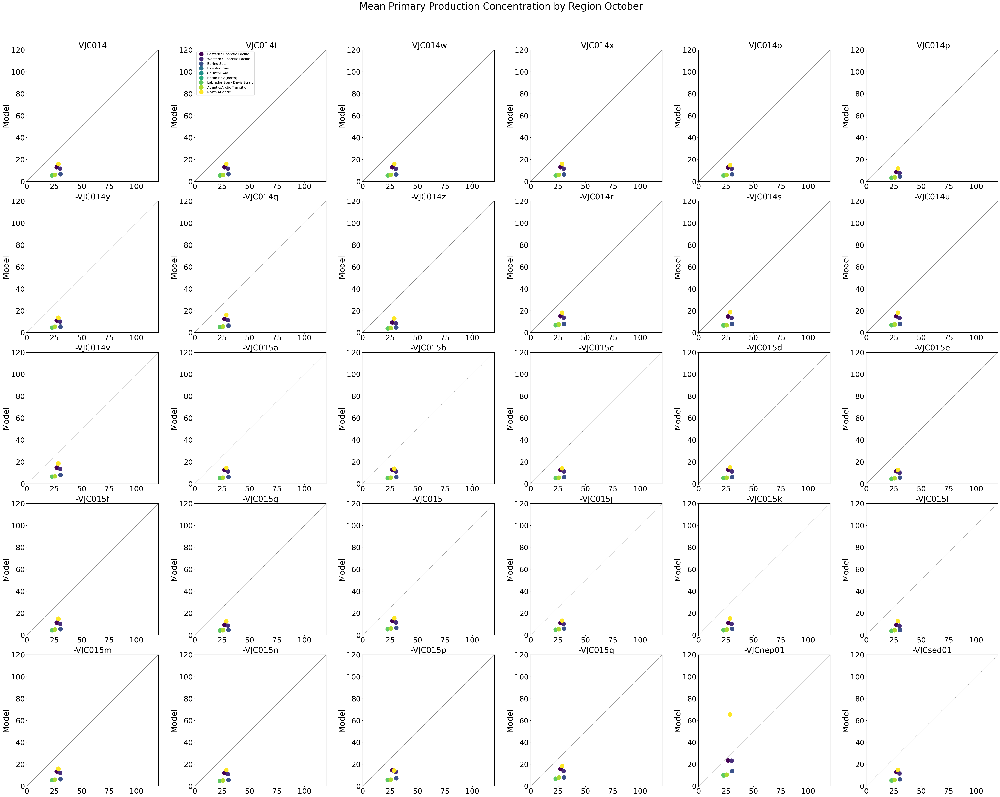

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

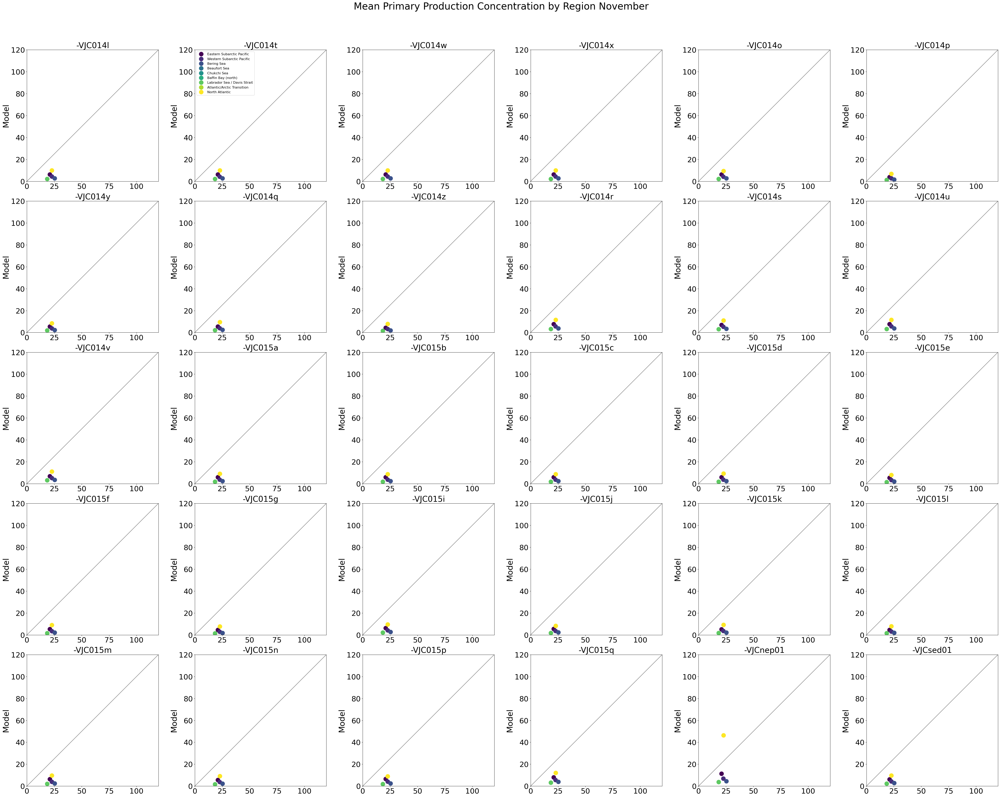

CREG025_LIM3_CANOE-VJC014l
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014l_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014z_monthly_PP.nc
CREG025_LIM3_CANOE-VJC014r
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC014r_month

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015d_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015e
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015e_mon

/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015m_monthly_PP.nc
CREG025_LIM3_CANOE-VJC015n
['/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc']
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_monthly_PP.nc
/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/CREG025_LIM3_CANOE-VJC015n_mon

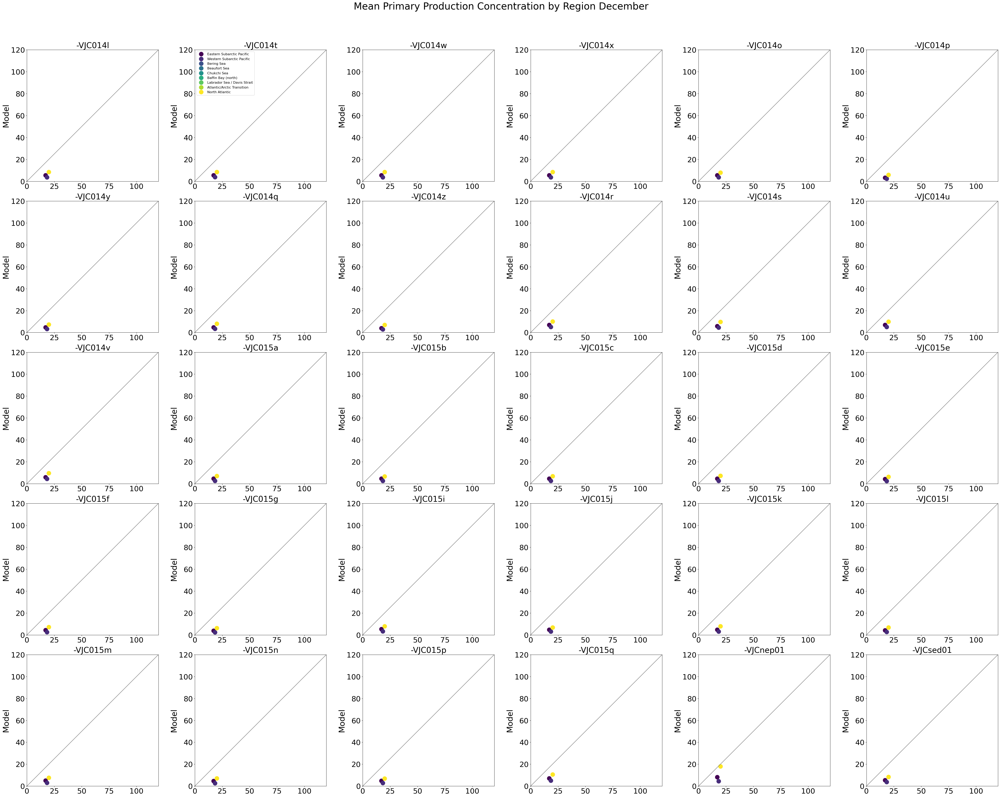

In [6]:
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['-VJC014l','-VJC014t','-VJC014w',
            '-VJC014x','-VJC014o','-VJC014p',
            '-VJC014y','-VJC014q','-VJC014z',
            '-VJC014r','-VJC014s','-VJC014u',
            '-VJC014v','-VJC015a','-VJC015b',
            '-VJC015c','-VJC015d','-VJC015e',
            '-VJC015f','-VJC015g','-VJC015i',
            '-VJC015j','-VJC015k','-VJC015l',
            '-VJC015m','-VJC015n','-VJC015p',
            '-VJC015q','-VJCnep01','-VJCsed01']


for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=5, ncols=6, figsize=(50, 40))
    fig.suptitle('Mean Primary Production Concentration by Region '+mmon, fontsize=34) 
    
    for a, asuff in enumerate(variants):
        cx=plt.subplot(5,6, a+1)
        runid = str('CREG025_LIM3_CANOE'+asuff)
        print(runid)
        data_all=np.zeros((12,ny,nx))
        flist = glob.glob("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/"+runid+"_monthly_PP.nc")
        flist.sort()
        print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot
            
        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsPP[im,:,:].squeeze().flatten()
                XMOD=modPP[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]                          
              
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
                print(filein)

            #if i > 5:
            #    plt.xlabel("Observations", fontsize=18)
            plt.ylabel("Model", fontsize=28)
            plt.title(asuff, fontsize=28)
            plt.xlim([0, 120]); plt.ylim([0,120])
            cx.tick_params(axis='both', labelsize=26)
            cx.set_aspect(1./cx.get_data_ratio())
            if a ==1:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='large')
        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
        
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/Means/PP/pp_month"+str("{:02d}".format(im+1)))

/tmp/ipykernel_8884/2009566042.py:38: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]


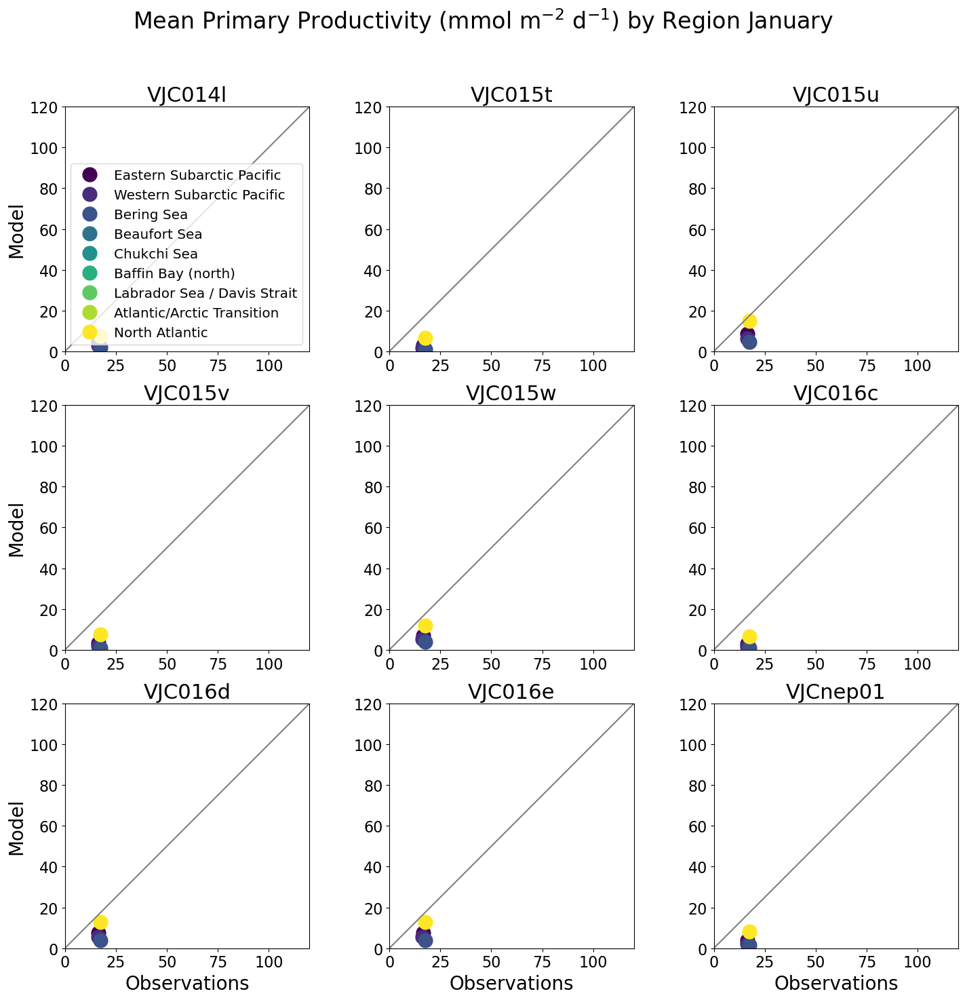

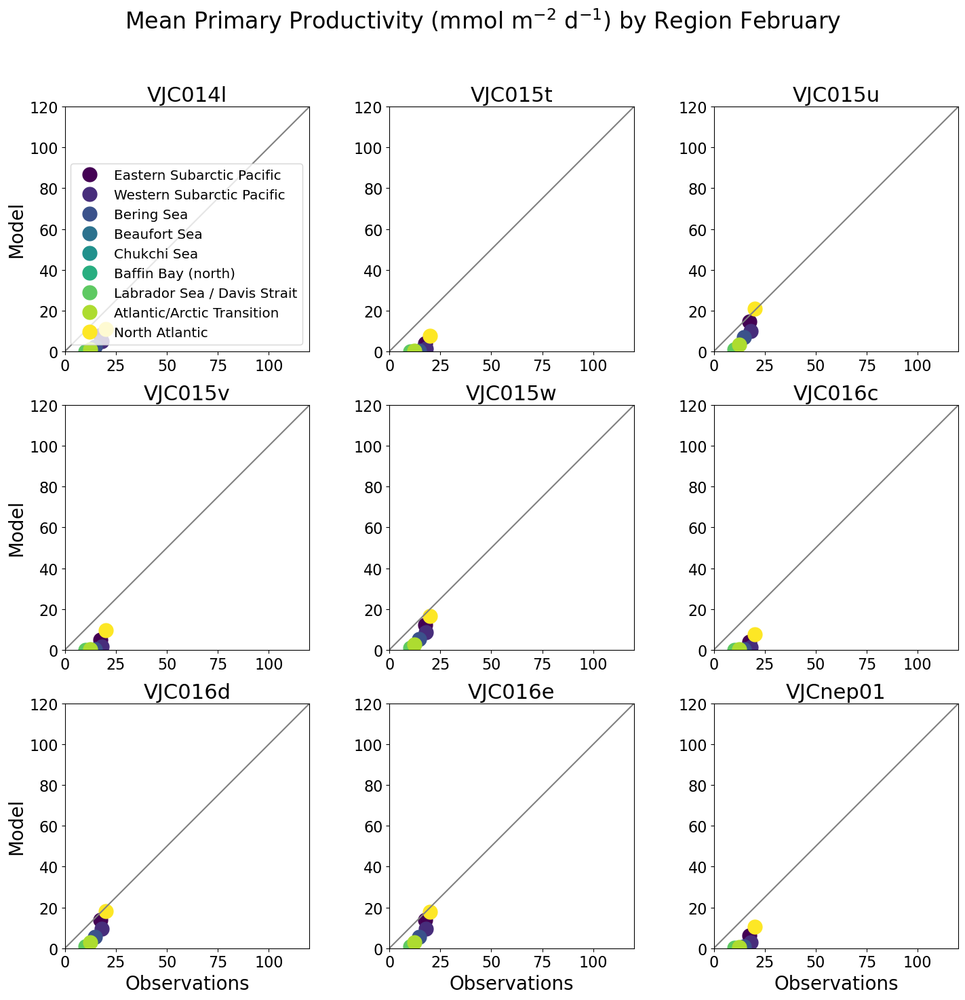

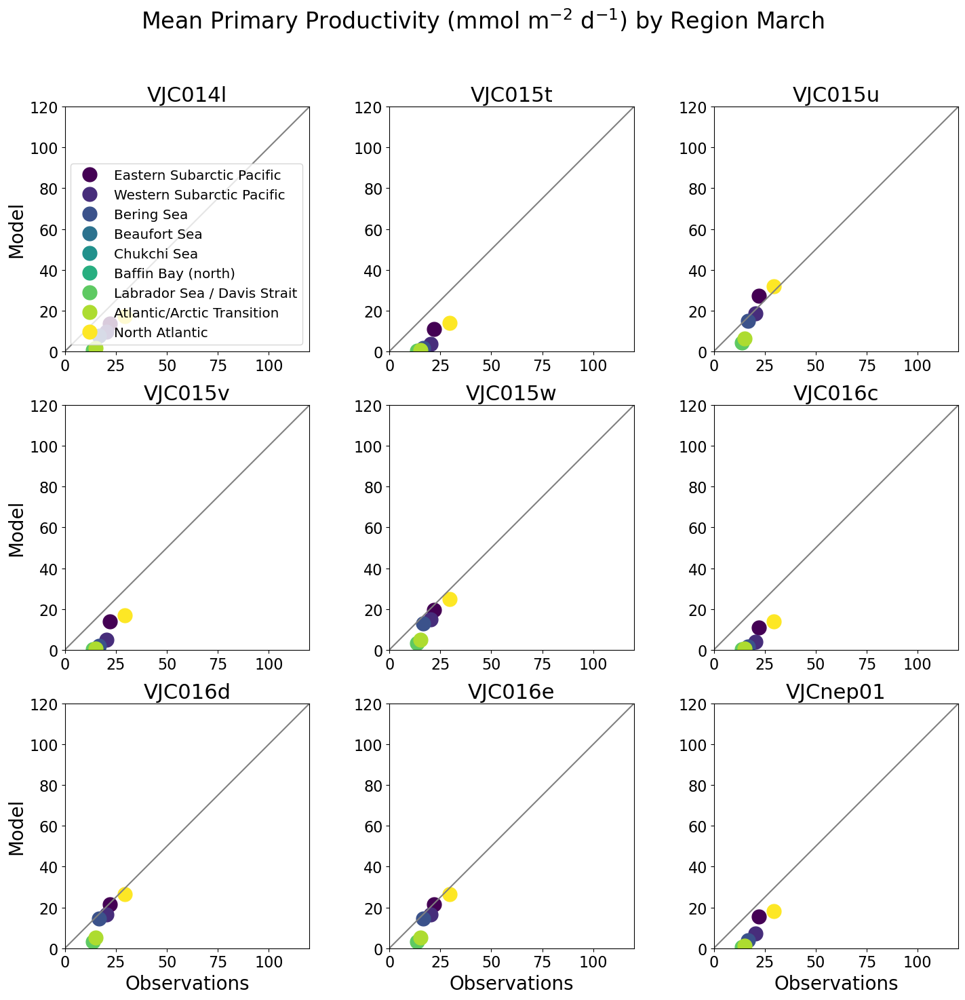

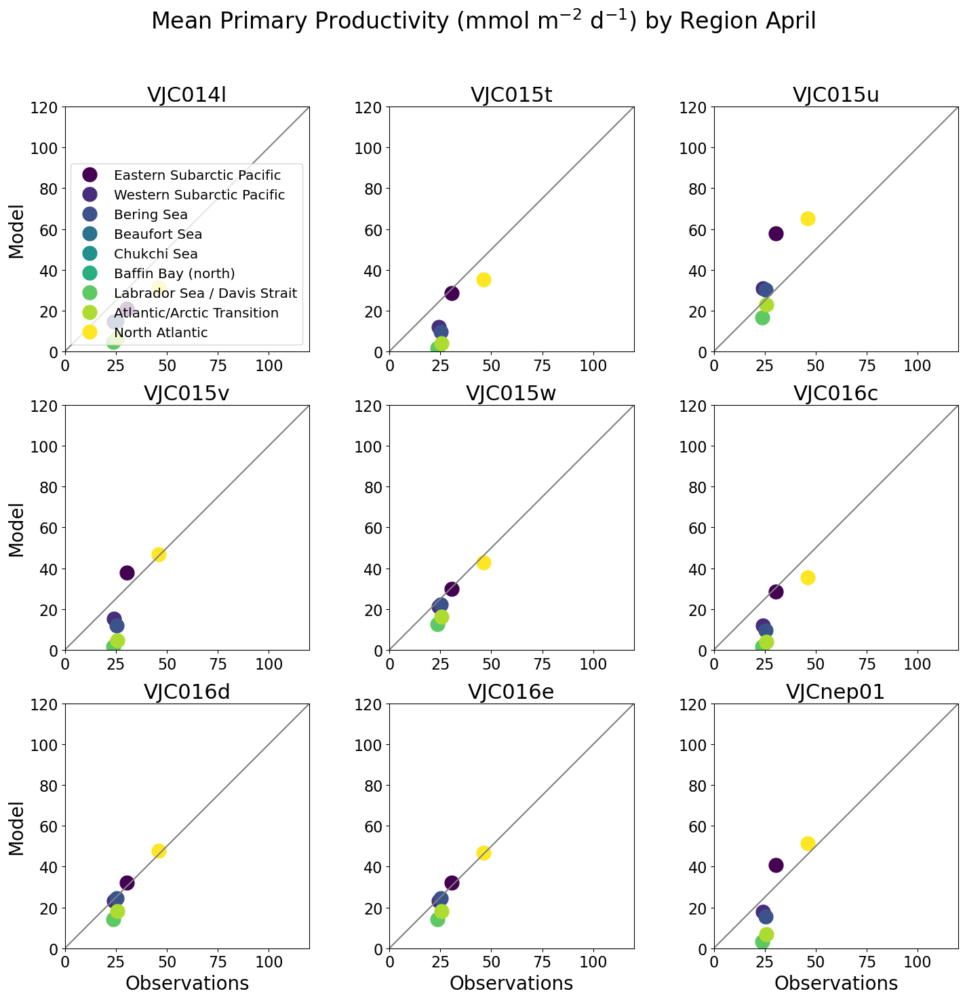

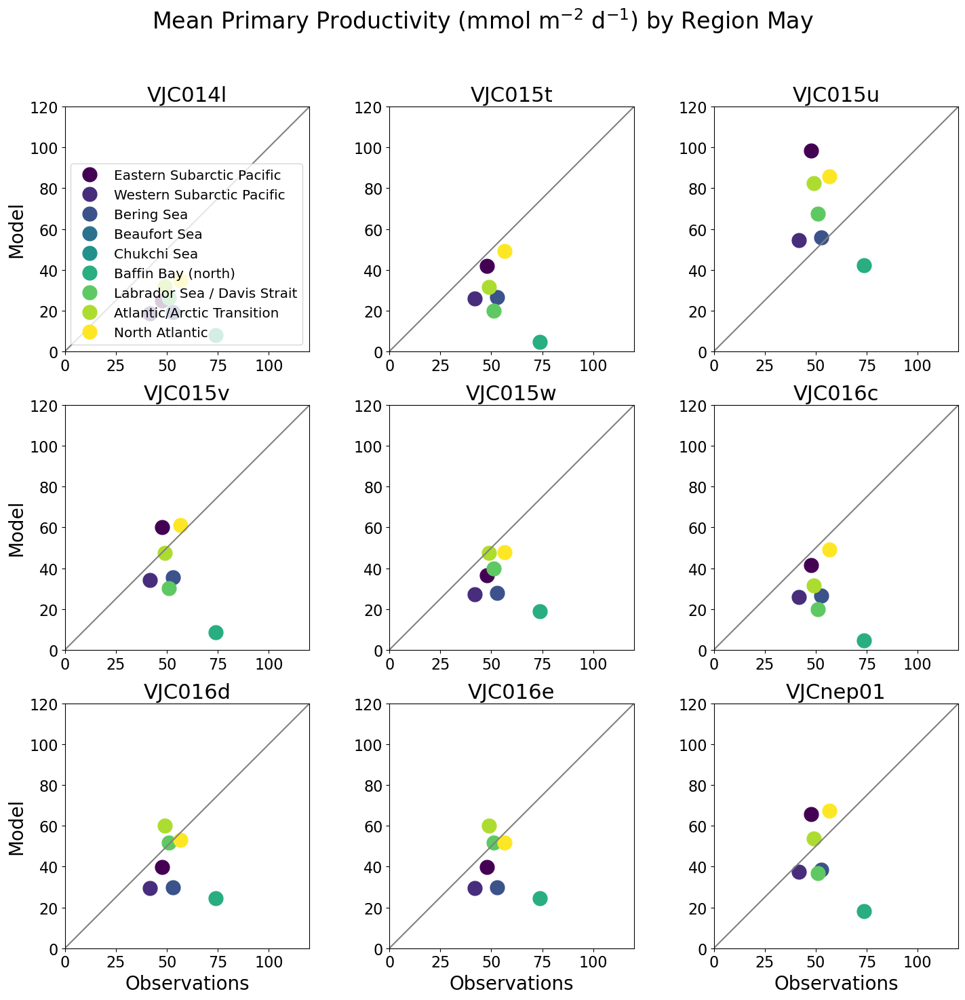

...

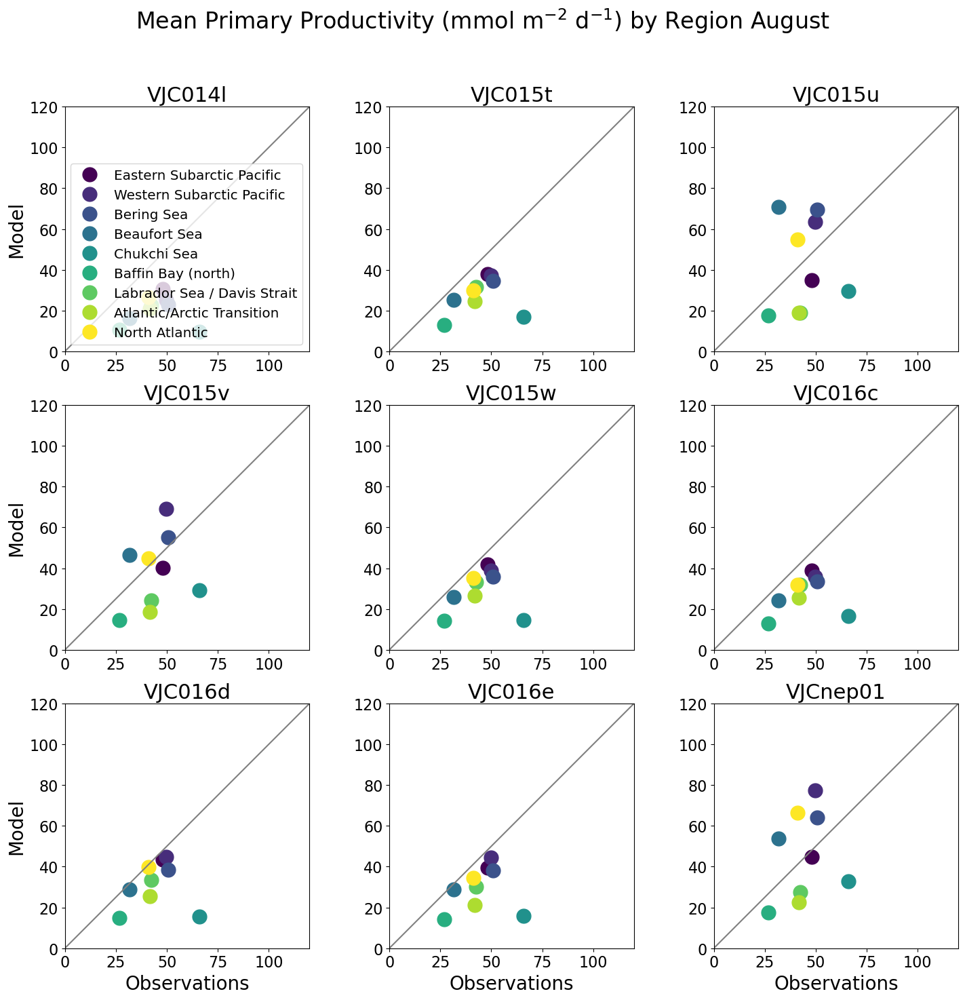

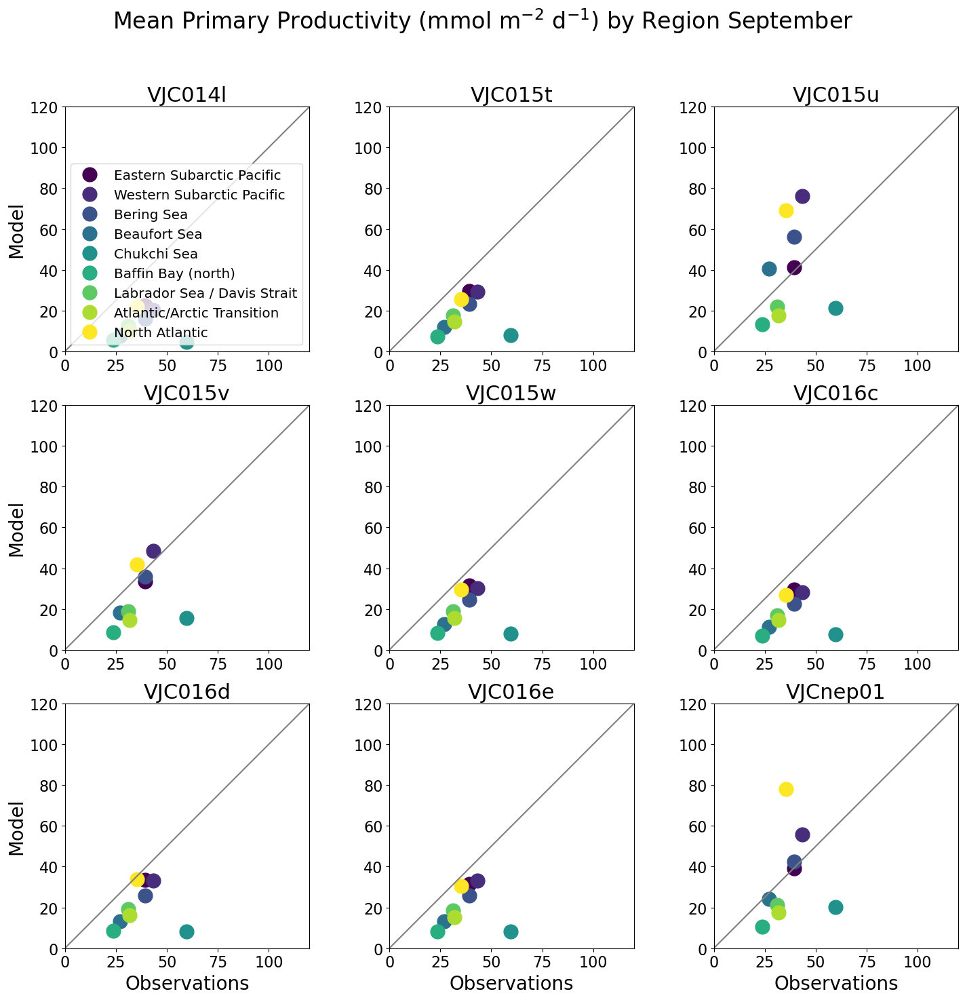

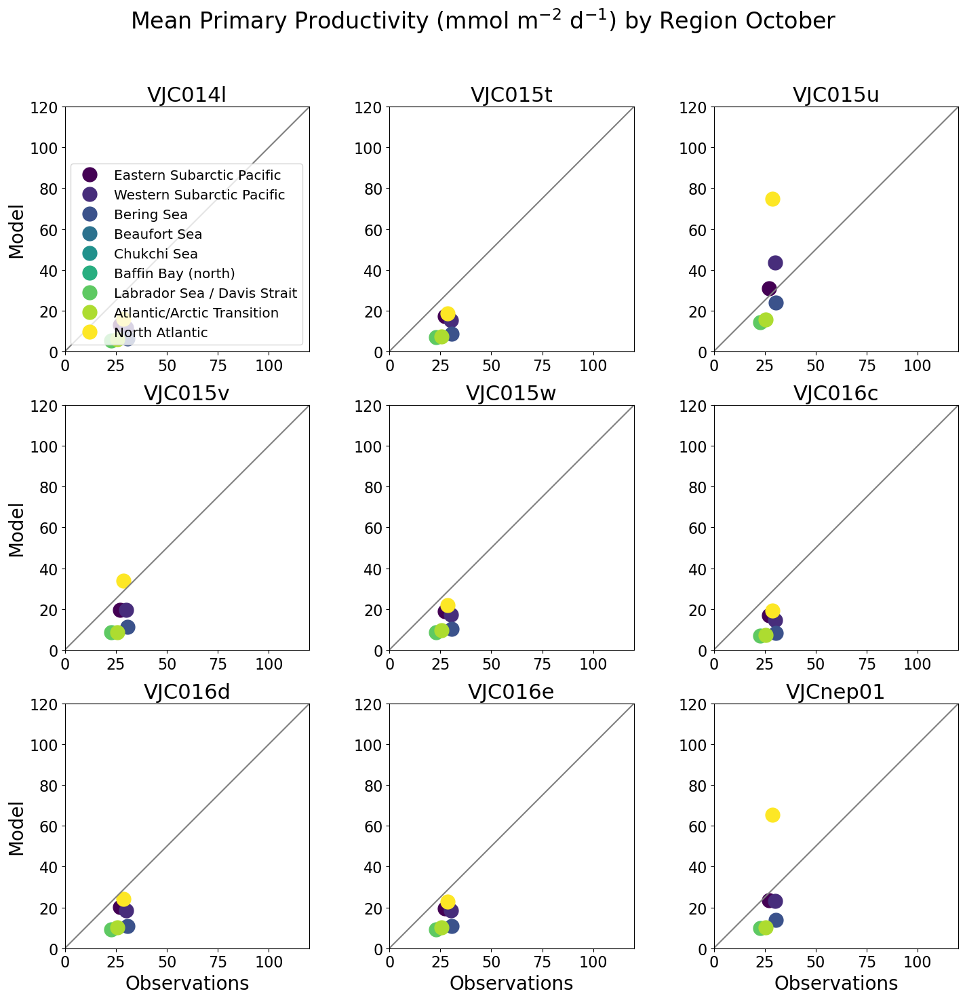

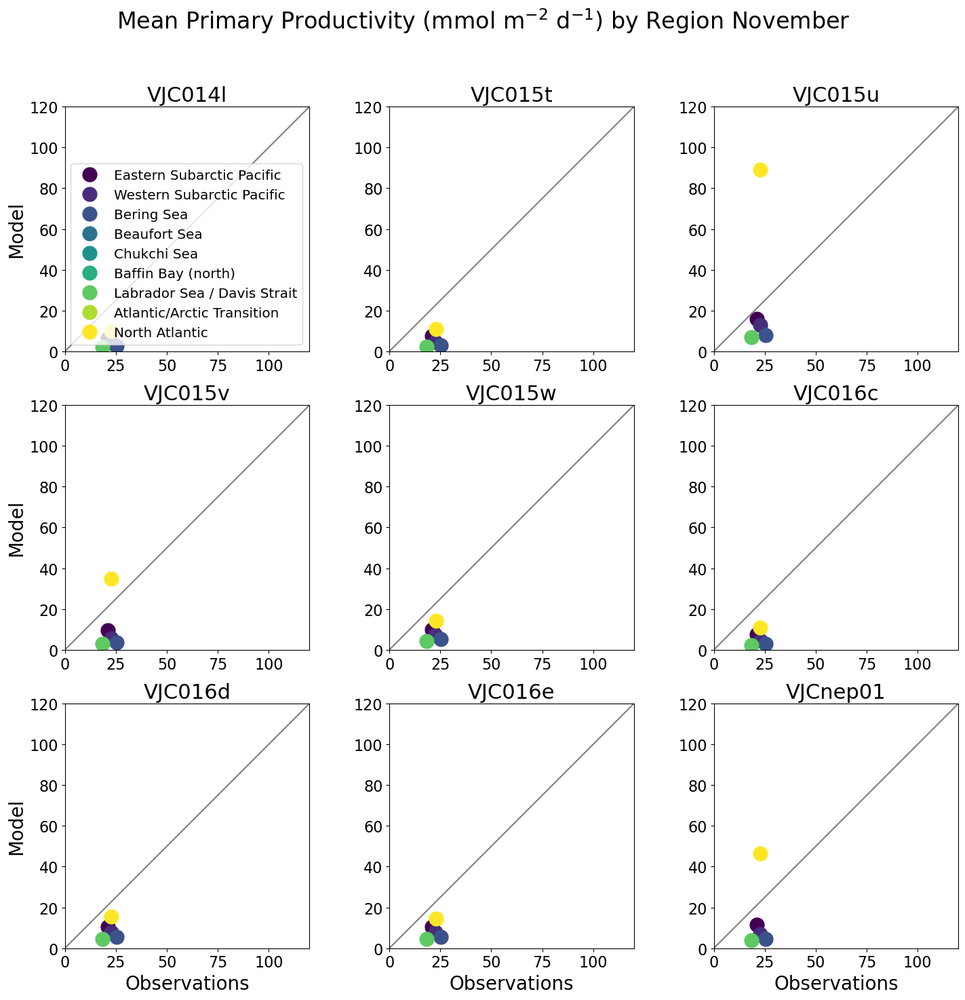

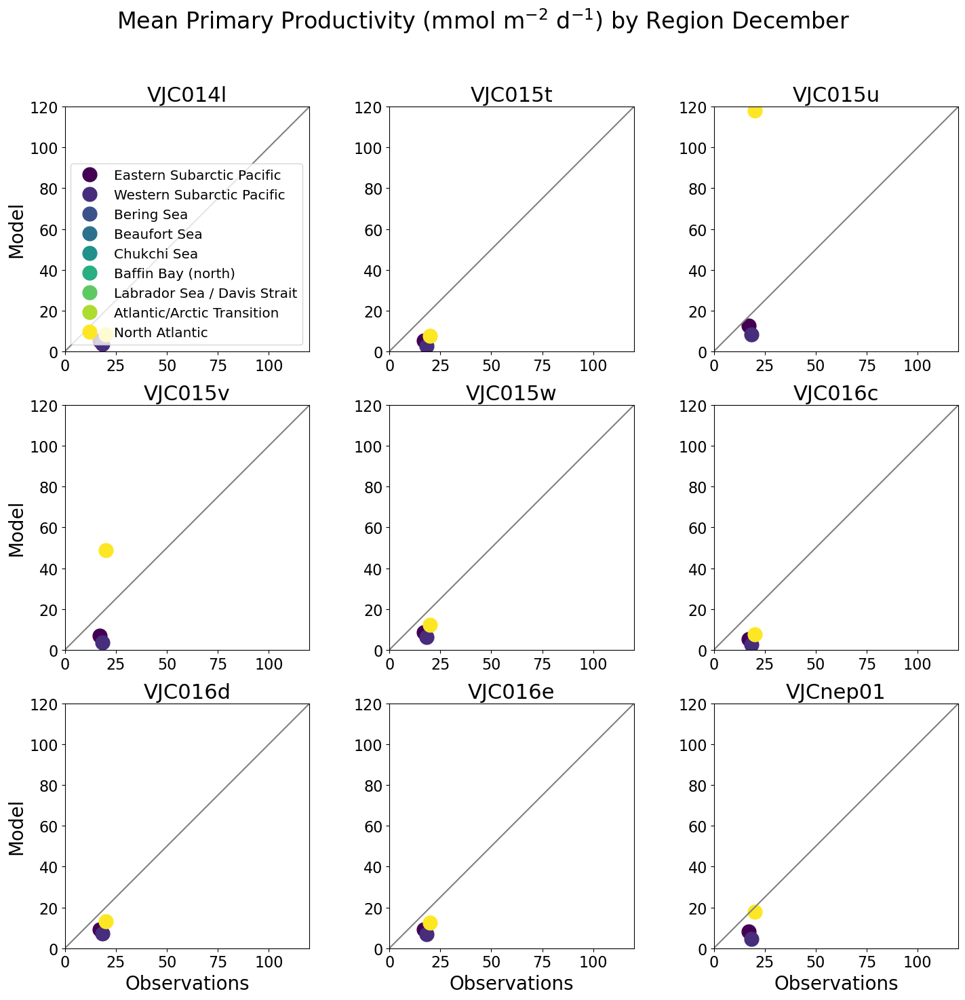

In [10]:
# Presentation quality plot for BioMod Workshop

import itertools
iz = np.arange(10)

months=['January','February','March','April','May','June','July','August','September','October','November','December']
regions = ['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic']
variants = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJCnep01']
variantdict = ['VJC014l','VJC015t','VJC015u','VJC015v','VJC015w','VJC016c','VJC016d','VJC016e','VJCnep01']


#variantdict = ['Base Case','gmax1=2.5','gmax2=1.35','reduced quadratic mortality (P+Zs)',
#              'reduced quadratic mortality (Zl)','NEP36 Parameters']

for im, mmon in enumerate(months):
    
    fig, axes = plt.subplots(num=1, clear=True, nrows=3, ncols=3, figsize=(15, 15))
    fig.suptitle('Mean Primary Productivity (mmol m$^{-2}$ d$^{-1}$) by Region '+mmon, fontsize=24) 
    #fig.suptitle('Primary Productivity (mmol m$^{-2}$ d$^{-1}$) by Region '+mmon, fontsize=24) 

    for a, asuff in enumerate(variants):
        cx=plt.subplot(3,3, a+1)
        runid = str('CREG025_LIM3_CANOE-'+asuff)
        #print(runid)
        data_all=np.zeros((12,ny,nx))
        flist = glob.glob("/gpfs/fs7/dfo/hpcmc/comda/stod000/CREG25/processed_op/PP/"+runid+"_monthly_PP.nc")
        flist.sort()
        #print(flist)
        ifile = 0
        colors =itertools.cycle(plt.get_cmap('viridis')(np.linspace(0,1, 9))) # potential pallettes: hsv, jet, gnuplot

        for i, c in enumerate(regions): 
            
            if i >= 0:
                
                filein = flist[ifile]
                data = Dataset(filein, "r", format="NETCDF4")
                modPP = data.variables['PPPHY'][:]+data.variables['PPPHY2'][:]

                tmaskz=tmask[iz,:,:].flatten()
                ZZ=(np.zeros((10,ny,nx))+regindx).flatten()    # broadcast regions map into a 3D array with same data for each depth
                XOBS=obsPP[im,:,:].squeeze().flatten()
                XMOD=modPP[im,:,:].squeeze().flatten()
                ii=np.where( ~np.isnan(XOBS) )[0]
                XOBS=XOBS[ii]; XMOD=XMOD[ii]; ZZ=ZZ[ii]; tmaskz=tmaskz[ii];
                jj=np.where( (XOBS>0.) & (ZZ==(i+1)) & (tmaskz==1) )[0]
                XOBS=np.mean(XOBS[jj]); XMOD=np.mean(XMOD[jj])
                
                colour = next(colors) 
                #plt.plot(XOBS[jj], XMOD[jj], "o", color=colour, markeredgecolor=colour, label=regions)

                plt.plot(XOBS, XMOD, "o", color=colour, markeredgecolor=colour, markersize=15, label=regions)
            
            plt.ylim([0,120]); plt.xlim([0,120])
            cx.tick_params(axis='both', labelsize=16)
            cx.set_aspect(1./cx.get_data_ratio())
            #plt.xticks([200,400,600,800,1000]);plt.yticks([200,400,600,800,1000])
            plt.title(variantdict[a], fontsize=22)

            if a ==0:
                plt.legend(labels=['Eastern Subarctic Pacific', 'Western Subarctic Pacific', 'Bering Sea', 'Beaufort Sea', 'Chukchi Sea', 'Baffin Bay (north)', 'Labrador Sea / Davis Strait', 'Atlantic/Arctic Transition', 'North Atlantic'],
                           fontsize='x-large', loc = 'lower right')
                
            if (a == 0) or (a == 3) or (a == 6):
                plt.ylabel("Model", fontsize=20)

            if (a == 6) or (a == 7) or (a == 8):
                plt.xlabel("Observations", fontsize=20)

        cx.plot([0, 1], [0, 1], color='grey', transform=cx.transAxes)
            
    plt.tight_layout(rect=(0,0,1,0.95), w_pad=0)
    plt.show()
    fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcde/PP/pp_means_month"+str("{:02d}".format(im+1)))
    #fig.savefig("/home/fid000/WORK7/ANALYSIS/model_evaluation/FIGURES/PresentationFigures/tuvwcde/PP/pp_month"+str("{:02d}".format(im+1)))